## Matrix Processing with Pandas
### 2023-10-12

This notebook details the step to process the matrix of allele frequencies for each variant in each sample. The matrix is generated from the output `bcftools` pipeline.

### Loading data into Pandas

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# load an example filtered matrix of footprinting scores, which overlap the variant sites in the vcf files

df_fpscore = pd.read_csv("/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/fps/TFDP1_M08108_2.00_BRCA-subtype-vcf-filtered-matrix.txt", sep="\t")

# drop the column "TFBS_strand" and "TFBS_score"
df_fpscore = df_fpscore.drop(columns=["TFBS_strand", "TFBS_score"])
# rename columns in the dataframe
df_fpscore = df_fpscore.rename(columns={"TFBS_chr": "Chromosome", "TFBS_start": "Start", "TFBS_end": "End", "2GAMBDQ_Normal-like_score": "2GAMBDQ_Norm_fps"})
# for all column names that end with the string 'score', replace the string with 'fps'
df_fpscore = df_fpscore.rename(columns=lambda x: x.replace('score', 'fps') if x.endswith('score') else x)
df_fpscore.head(n=10)

,Chromosome,Start,End,98JKPD8_LumA_fps,ANAB5F7_Basal_fps,S6R691V_Her2_fps,PU24GB8_LumB_fps,2GAMBDQ_Norm_fps
0,chr1,191257,191268,0.00000,0.00000,0.00000,0.00000,0.00000
1,chr1,818021,818032,0.02966,0.04399,0.02131,0.03470,0.03443
2,chr1,818780,818791,0.02572,0.02376,0.02271,0.02814,0.03391
3,chr1,960570,960581,0.28046,0.33500,0.28495,0.27618,0.22986
4,chr1,977015,977026,1.10047,0.50514,0.71035,1.21305,1.30155
5,chr1,977047,977058,0.88179,0.40974,0.53173,0.98628,1.07101
6,chr1,977110,977121,0.13137,0.08845,0.10541,0.16812,0.15493
7,chr1,977142,977153,0.14436,0.08225,0.09233,0.17809,0.14291
8,chr1,977174,977185,0.22616,0.10631,0.13808,0.24319,0.22306
9,chr1,977206,977217,0.29710,0.15487,0.21703,0.33427,0.31093


In [3]:
# create a vcf load function for the query vcfs
def load_vcf(vcf_path):
    # load up the vcf file with indels and multiallelic sites split into separate rows
    df_vcf = pd.read_csv(vcf_path, sep="\t")
    # rename columns in the dataframe
    df_vcf = df_vcf.rename(columns={"#[1]CHROM": "Chromosome", "[2]POS": "Start", "[3]REF": "ref_allele", "[4]ALT": "alt_allele", "[5]AF": "AF"})
    # add a column next to the "start" column called "end" with the same value as the "start" column
    df_vcf.insert(2, "End", df_vcf["Start"])
    return df_vcf

# now put the paths in a list
paths = [
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/ANAB5F7/ANAB5F7_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/98JKPD8/98JKPD8_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/PU24GB8/PU24GB8_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/S6R691V/S6R691V_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/2GAMBDQ/2GAMBDQ_TFDP1_M08108_2.00_AF-per-site-with-indels.txt"
]

# create a list of IDs
ids = [ "ANAB5F7_basal", "98JKPD8_lumA", "PU24GB8_lumB", "S6R691V_her2", "2GAMBDQ_norm"]

# create a pair dictionary
path_id_dict = {id: load_vcf(path) for id in ids for path in paths if id.split("_")[0] in path}

print(path_id_dict)


{'ANAB5F7_basal':      Chromosome      Start        End ref_allele   alt_allele        AF
0          chr1     818025     818025          C            A  0.812500
1          chr1     818783     818783          T            C  0.033333
2          chr1     977023     977023          G            A  0.941176
3          chr1     977055     977055          G            A  0.500000
4          chr1     977118     977118          G            A  0.852941
...         ...        ...        ...        ...          ...       ...
5979       chrX  153494830  153494830          G            A  0.352941
5980       chrX  153495413  153495413          G            A  0.882353
5981       chrX  154444635  154444635    GGGACGG  GGGACGGACGG  0.058824
5982       chrY   11108021   11108021          C            T  0.382353
5983       chrY   11108024   11108024          C            T  0.294118

[5984 rows x 6 columns], '98JKPD8_lumA':      Chromosome      Start        End ref_allele   alt_allele        AF
0   

### Converting Dataframes into Pyranges Objects with PyRanges

In [4]:
import pyranges as pr

gr_fpscore = pr.PyRanges(df_fpscore)
print(type(gr_fpscore))
gr_fpscore

<class 'pyranges.pyranges_main.PyRanges'>


/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,Chromosome,Start,End,98JKPD8_LumA_fps,ANAB5F7_Basal_fps,S6R691V_Her2_fps,PU24GB8_LumB_fps,2GAMBDQ_Norm_fps
0,chr1,191257,191268,0.00000,0.00000,0.00000,0.00000,0.00000
1,chr1,818021,818032,0.02966,0.04399,0.02131,0.03470,0.03443
2,chr1,818780,818791,0.02572,0.02376,0.02271,0.02814,0.03391
3,chr1,960570,960581,0.28046,0.33500,0.28495,0.27618,0.22986
4,chr1,977015,977026,1.10047,0.50514,0.71035,1.21305,1.30155
...,...,...,...,...,...,...,...,...
9555,chrX,153934861,153934872,0.19670,0.16790,0.17212,0.19046,0.16161
9556,chrX,154444629,154444640,0.04900,0.07431,0.07307,0.09013,0.04233
9557,chrX,155010397,155010408,0.01177,0.00497,0.00875,0.01298,0.01987
9558,chrX,155641610,155641621,0.01249,0.01243,0.01329,0.01492,0.01740


In [17]:
# delete a variable from current namespace
%reset_selective -f pathstring


In [5]:
# load up vcf dfs into pyranges 
grs = {}
for name,vcf in path_id_dict.items():
    gr_vcf = pr.PyRanges(vcf)
    grs[name] = gr_vcf

print(grs)

{'ANAB5F7_basal': +--------------+-----------+-----------+--------------+-------+
| Chromosome   | Start     | End       | ref_allele   | +2    |
| (category)   | (int64)   | (int64)   | (object)     | ...   |
|--------------+-----------+-----------+--------------+-------|
| chr1         | 818025    | 818025    | C            | ...   |
| chr1         | 818783    | 818783    | T            | ...   |
| chr1         | 977023    | 977023    | G            | ...   |
| chr1         | 977055    | 977055    | G            | ...   |
| ...          | ...       | ...       | ...          | ...   |
| chrX         | 154444635 | 154444635 | GGGACGG      | ...   |
| chrX         | 153495413 | 153495413 | G            | ...   |
| chrX         | 153494830 | 153494830 | G            | ...   |
| chrX         | 150364545 | 150364545 | C            | ...   |
| chrY         | 11108024  | 11108024  | C            | ...   |
| chrY         | 11108021  | 11108021  | C            | ...   |
+--------------+------

/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain c

### Exploratory Plots with Seaborn

In [ ]:
count = 0
for key, val in grs.items():
    
    if count == 0:
        overlap = gr_fpscore.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    else:
        overlap = overlap.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    
    # drop the column "End" column
    overlap = overlap.drop([f"End_{key}_varsite_pos"])

    # cast back into a dataframe and rename metadata columns
    df = overlap.df.rename(columns={f"Start_{key}_varsite_pos": f"{key}_varsite_pos", "ref_allele": f"{key}_ref_allele", "alt_allele": f"{key}_alt_allele", "AF": f"{key}_AF"})
    
    # replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
    # Define a dictionary mapping column names to values to replace
    replace_dict = {f"{key}_varsite_pos": {-1: None}, f"{key}_ref_allele": {str(-1): None}, f"{key}_alt_allele": {str(-1): None}, f"{key}_AF": {-1: 0}}
    df = df.replace(replace_dict)

    # cast back into pyrange object
    overlap = pr.PyRanges(df)

    # increment count
    count += 1

# save to file
# overlap.df.to_csv("TFDP1_M08108_2.00_fpscore-af-varsites-combined-matrix.tsv", sep="\t", index=False, na_rep='NULL')

overlap.df[19:30]

The chr regions are somehow not unique anymore because each region can be associated with multiple alleles and these are written onto new lines. To reduce the chr regions to unique sites and collapse the rows into unique regions, what we can do is to assign only the allelic site that has the largest AF value out of the rest mapped to the same region (using `max()` method).

First, write a test script to see if the logic works. 

In [ ]:
test_overlap = gr_fpscore.join(grs['ANAB5F7_basal'], how='left', suffix="_ANAB5F7_basal_varsite_pos", preserve_order = True)

# drop END column
test_overlap = test_overlap.drop(["End_ANAB5F7_basal_varsite_pos"])
# cluster the pyRanges object by genomic range
test_overlap = test_overlap.cluster(slack=-1)
# filter the pandas df representation of the pyRanges object by the AF column max value for each cluster/group
filtered_df = test_overlap.df.loc[test_overlap.df.groupby('Cluster')['AF'].idxmax()]
# then rename the columns 
filtered_df = filtered_df.rename(columns={"Start_ANAB5F7_basal_varsite_pos": "ANAB5F7_basal_varsite_pos", "ref_allele": "ANAB5F7_basal_ref_allele", "alt_allele": "ANAB5F7_basal_alt_allele", "AF": "ANAB5F7_basal_AF"})
# replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
# Define a dictionary mapping column names to values to replace
replace_dict = {"ANAB5F7_basal_varsite_pos": {-1: None}, "ANAB5F7_basal_ref_allele": {str(-1): None}, "ANAB5F7_basal_alt_allele": {str(-1): None}, "ANAB5F7_basal_AF": {-1: 0}}
filtered_df = filtered_df.replace(replace_dict)
# drop cluster column
filtered_df = filtered_df.drop(columns=["Cluster"])

filtered_gr = pr.PyRanges(filtered_df)

test_overlap = filtered_gr.join(grs['2GAMBDQ_norm'], how='left', suffix="_2GAMBDQ_norm_varsite_pos", preserve_order = True)
# drop END column
test_overlap = test_overlap.drop(["End_2GAMBDQ_norm_varsite_pos"])
# cluster the pyRanges object by genomic range
test_overlap = test_overlap.cluster(slack=-1)
# filter the pandas df representation of the pyRanges object by the AF column max value for each cluster/group
filtered_df = test_overlap.df.loc[test_overlap.df.groupby('Cluster')['AF'].idxmax()]
# then rename the columns 
filtered_df = filtered_df.rename(columns={"Start_2GAMBDQ_norm_varsite_pos": "2GAMBDQ_norm_varsite_pos", "ref_allele": "2GAMBDQ_norm_ref_allele", "alt_allele": "2GAMBDQ_norm_alt_allele", "AF": "2GAMBDQ_norm_AF"})
# replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
# Define a dictionary mapping column names to values to replace
replace_dict = {"2GAMBDQ_norm_varsite_pos": {-1: None}, "2GAMBDQ_norm_ref_allele": {str(-1): None}, "2GAMBDQ_norm_alt_allele": {str(-1): None}, "2GAMBDQ_norm_AF": {-1: 0}}
filtered_df = filtered_df.replace(replace_dict)
# drop cluster column
filtered_df = filtered_df.drop(columns=["Cluster"])
filtered_df.iloc[19:30]
# filtered_df.shape

# # merge back the af_max series with the original dataframe
# result_df = test_overlap.df.merge(af_max, left_on='Cluster', right_index=True, suffixes=('', '_max'))
# result_df.head(n=30)

Then, incorporate a `for` loop to process and merge all of the subtype data. 

In [6]:
pd.set_option('display.max_columns', 999)

In [8]:
count = 0
for key, val in grs.items():  
    if count == 0:
        overlap = gr_fpscore.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    else:
        overlap = filtered_gr.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    
    # drop the column "End" column
    overlap = overlap.drop([f"End_{key}_varsite_pos"])

    # cluster the pyRanges object by genomic range
    overlap = overlap.cluster(slack=-1)

    # cast back into a dataframe and filter by the AF column's max value (per cluster); this returns a filtered dataframe
    filtered_df = overlap.df.loc[overlap.df.groupby('Cluster')['AF'].idxmax()]

    # then rename the columns
    filtered_df = filtered_df.rename(columns={f"Start_{key}_varsite_pos": f"{key}_varsite_pos", "ref_allele": f"{key}_ref_allele", "alt_allele": f"{key}_alt_allele", "AF": f"{key}_AF"})
    
    # replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
    # Define a dictionary mapping column names to values to replace
    replace_dict = {f"{key}_varsite_pos": {-1: None}, f"{key}_ref_allele": {str(-1): None}, f"{key}_alt_allele": {str(-1): None}, f"{key}_AF": {-1: 0}}
    filtered_df = filtered_df.replace(replace_dict)

    # drop cluster column
    filtered_df = filtered_df.drop(columns=["Cluster"])

    # cast back into pyrange object
    filtered_gr = pr.PyRanges(filtered_df)

    # increment count
    count += 1

final_df = filtered_gr.df

# create a column called 'region_id'
final_df["region_id"] = final_df["Chromosome"].astype(str) + ":" + final_df["Start"].astype(str) + "-" + final_df["End"].astype(str)

# for all column name ending with the string '_fps', split the string, take the second element, change the first letter in the string to lowercase, and reconstruct the original string with the new first letter
final_df = final_df.rename(columns=lambda x: x.split('_')[0] + '_' + x.split('_')[1][0].lower() + x.split('_')[1][1:] + '_fps' if x.endswith('_fps') else x)

# save to file
final_df.to_csv("TFDP1_M08108_2.00_fpscore-af-varsites-combined-matrix-wide.tsv", sep="\t", index=False, na_rep='NULL')

# filtered_gr.df.shape
final_df.iloc[19:30]

/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain c

,Chromosome,Start,End,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,ANAB5F7_basal_varsite_pos,ANAB5F7_basal_ref_allele,ANAB5F7_basal_alt_allele,ANAB5F7_basal_AF,98JKPD8_lumA_varsite_pos,98JKPD8_lumA_ref_allele,98JKPD8_lumA_alt_allele,98JKPD8_lumA_AF,PU24GB8_lumB_varsite_pos,PU24GB8_lumB_ref_allele,PU24GB8_lumB_alt_allele,PU24GB8_lumB_AF,S6R691V_her2_varsite_pos,S6R691V_her2_ref_allele,S6R691V_her2_alt_allele,S6R691V_her2_AF,2GAMBDQ_norm_varsite_pos,2GAMBDQ_norm_ref_allele,2GAMBDQ_norm_alt_allele,2GAMBDQ_norm_AF,region_id
19,chr1,977682,977693,0.13628,0.06780,0.07093,0.09131,0.10189,None,None,None,0.000000,None,None,None,0.000000,977690,G,A,0.722222,None,None,None,0.000000,None,None,None,0.000000,chr1:977682-977693
20,chr1,986626,986637,0.06207,0.01957,0.02828,0.05148,0.04807,986629,G,A,0.156250,986629,G,A,0.166667,986629,G,A,0.176471,986629,G,A,0.264706,986629,G,A,0.142857,chr1:986626-986637
21,chr1,996339,996350,0.08072,0.04823,0.06484,0.05456,0.06911,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,chr1:996339-996350
22,chr1,998799,998810,0.18224,0.18346,0.16911,0.19714,0.13315,None,None,None,0.000000,998800,C,G,0.041667,998800,C,G,0.026316,None,None,None,0.000000,None,None,None,0.000000,chr1:998799-998810
23,chr1,999627,999638,0.22751,0.11144,0.14534,0.19250,0.13830,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,999637,G,A,0.062500,chr1:999627-999638
24,chr1,1001633,1001644,0.14990,0.09145,0.08237,0.11098,0.10277,1001634,A,T,0.029412,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,chr1:1001633-1001644
25,chr1,1019832,1019843,0.52715,0.39803,0.37521,0.52936,0.43562,1019833,T,C,1.000000,1019833,T,C,1.000000,1019833,T,C,1.000000,1019833,T,C,1.000000,1019833,T,C,1.000000,chr1:1019832-1019843
26,chr1,1020018,1020029,0.60906,0.52767,0.50946,0.64164,0.49198,None,None,None,0.000000,1020021,G,T,0.041667,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,chr1:1020018-1020029
27,chr1,1020936,1020947,0.30508,0.21614,0.20883,0.26597,0.23615,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,chr1:1020936-1020947
28,chr1,1041174,1041185,0.06104,0.05750,0.05748,0.08209,0.04792,1041178,C,G,0.031250,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,None,None,None,0.000000,chr1:1041174-1041185


In [9]:
final_df.shape

(9560, 29)

### Exploratory Visualization
#### Plotting Allele Frequency (AF) Distribution

First, let's subset the filtered gr object into a dataframe containing only the AF data. 

Then, we can plot the AF distribution for each subtype.

In [10]:
import seaborn as sns
import numpy as np

In [11]:
# subset the dataframe to gget just the _AF columns
af_df = final_df.filter(regex='_AF$')
af_df

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,0.000000,0.000000,0.026316,0.000000,0.000000
1,0.812500,0.900000,0.833333,0.900000,0.875000
2,0.033333,0.125000,0.055556,0.062500,0.000000
3,0.000000,0.041667,0.000000,0.000000,0.000000
4,0.941176,1.000000,0.947368,0.911765,1.000000
...,...,...,...,...,...
9555,0.000000,0.000000,0.000000,0.000000,0.062500
9556,0.058824,0.125000,0.105263,0.000000,0.000000
9557,0.000000,0.312500,0.392857,0.100000,0.083333
9558,0.000000,0.000000,0.029412,0.000000,0.000000


In [12]:
# see summary statistics
af_df.describe()

# the observations are very skewed, most values are zeroes

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.000000,9560.000000,9560.000000,9560.000000,9560.000000
mean,0.124445,0.124244,0.123915,0.125958,0.125726
std,0.225746,0.234125,0.228397,0.228968,0.238772
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.029412,0.000000,0.026316,0.029412,0.000000
75%,0.133333,0.125000,0.131579,0.142857,0.125000
max,1.000000,1.000000,1.000000,1.000000,1.000000


In [13]:
# this is actually in a wide format, so we need to melt it into a long format for plotting
af_df_long = af_df.melt(var_name="sample_id", value_name="AF")
# remove the "_AF" suffix from the "sample_id" column
af_df_long["sample_id"] = af_df_long["sample_id"].apply(lambda x: x.replace("_AF", ""))
af_df_long

,sample_id,AF
0,ANAB5F7_basal,0.000000
1,ANAB5F7_basal,0.812500
2,ANAB5F7_basal,0.033333
3,ANAB5F7_basal,0.000000
4,ANAB5F7_basal,0.941176
...,...,...
47795,2GAMBDQ_norm,0.062500
47796,2GAMBDQ_norm,0.000000
47797,2GAMBDQ_norm,0.083333
47798,2GAMBDQ_norm,0.000000


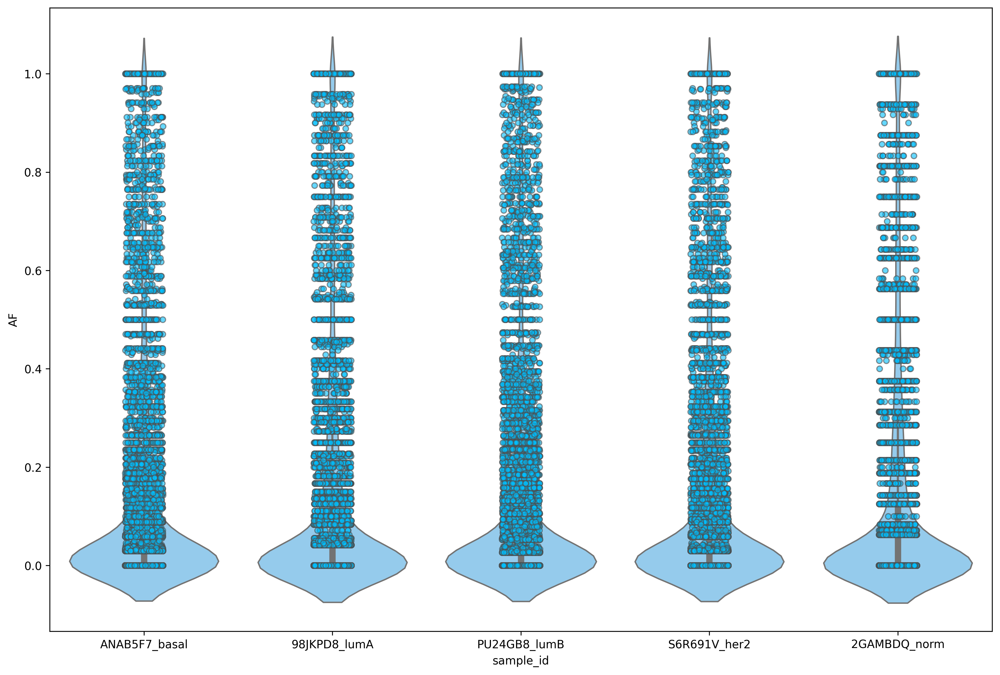

In [43]:
# visualize individual data points using a stripplot and scatterplot
fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
sns.stripplot(x="sample_id", y="AF", data=af_df_long, jitter=True, alpha=0.6, linewidth=1, color='deepskyblue', ax=ax)
sns.violinplot(x="sample_id", y="AF", data=af_df_long, color='lightskyblue', ax=ax)
plt.show()

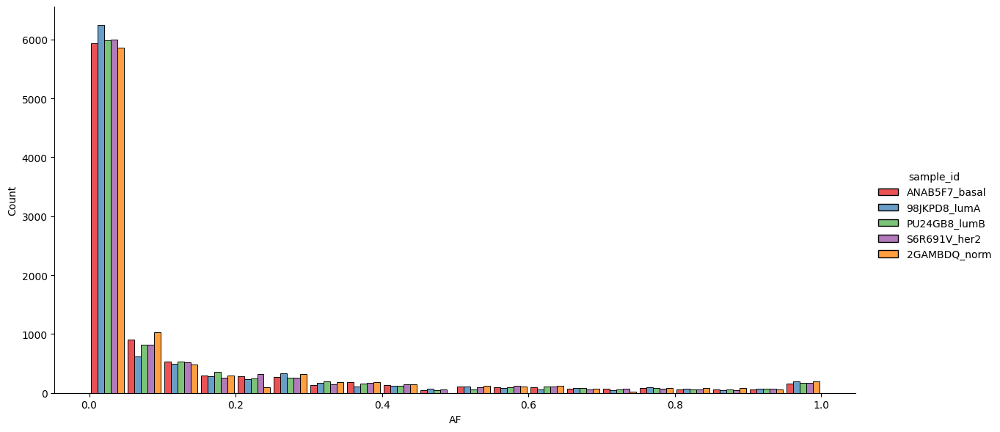

In [41]:
# boxplot with subtypes
sns.displot(af_df_long, x="AF", hue='sample_id', bins=20, multiple='dodge', shrink=.9, height=6, aspect=2, palette="Set1")

In [40]:
af_df[af_df == 0].count()

ANAB5F7_basal_AF    4529
98JKPD8_lumA_AF     5425
PU24GB8_lumB_AF     4656
S6R691V_her2_AF     4736
2GAMBDQ_norm_AF     5858
dtype: int64

As seen above, about half of the observations/data points are equal to 0. This suggests a very left-skewed distribution tending towards zero. This makes sense because you would expect that most sites do not have allelic variants (AF = 0 indicates that there are zero reads in the current data that support the alternative allele).

What we can do next is to visualize the summary statistics of the AF distribution after excluding the zero values.

Text(0.5, 1.0, 'Distribution of Allelic Frequency across Called Variants in TFDP1_M08108_2.00 TFBS')

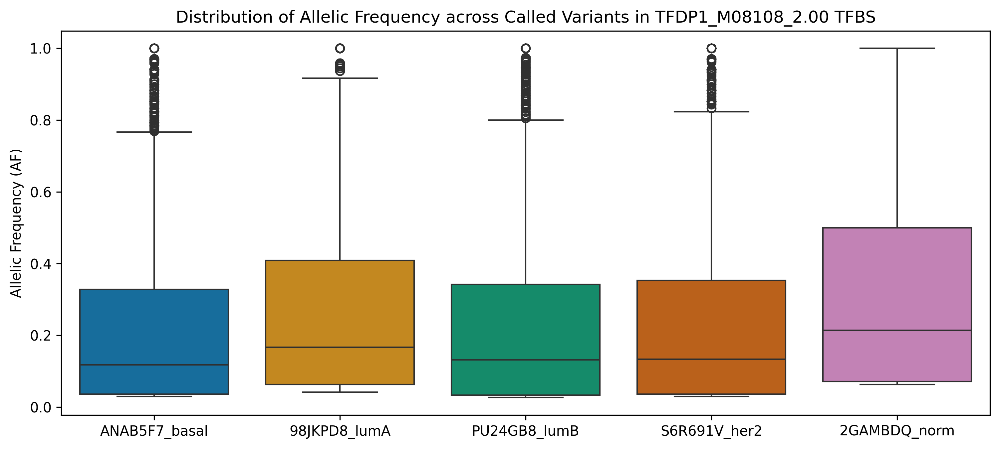

In [42]:
# exclude the zeroes
af_df_long_nozero = af_df_long[af_df_long.AF != 0]

# plot boxplot
plt.figure(figsize=(12,5), dpi=300)
sns.boxplot(data=af_df_long_nozero, x='sample_id', y='AF', hue='sample_id', palette='colorblind') #, hue="sample_id", x="AF", legend=False)

# add labels and title
plt.xlabel('')
plt.ylabel('Allelic Frequency (AF)')
plt.title('Distribution of Allelic Frequency across Called Variants in TFDP1_M08108_2.00 TFBS')


Text(0.5, 1.0, 'Distribution of Allelic Frequency across Called Variants in TFDP1_M08108_2.00 TFBS')

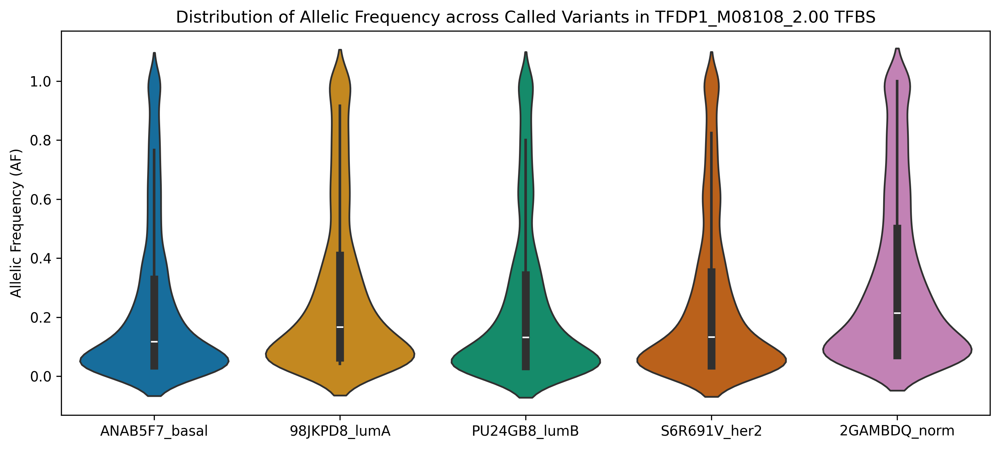

In [44]:
# plot boxplot
plt.figure(figsize=(12,5), dpi=300)
sns.violinplot(data=af_df_long_nozero, x='sample_id', y='AF', hue='sample_id', palette='colorblind') #, hue="sample_id", x="AF", legend=False)

# add labels and title
plt.xlabel('')
plt.ylabel('Allelic Frequency (AF)')
plt.title('Distribution of Allelic Frequency across Called Variants in TFDP1_M08108_2.00 TFBS')

When zeroes are filtered out as shown below in the kernel density estimate plot below, the distribution of AF values that are not zeroes can be seen clearly, though it still remains left-skewed. There seems to be a bump at AF = 0.5. The AF distribution is rather discrete, which makes sense because AF is a ratio derived from discrete counts of alleles. There is also a bump at AF = 1.0, which indicates that there are binding sites containing alternative allele (mutation) supported by 100% of the observed alleles across samples. They could be known SNPs, or they could be novel mutations associated with BRCA.

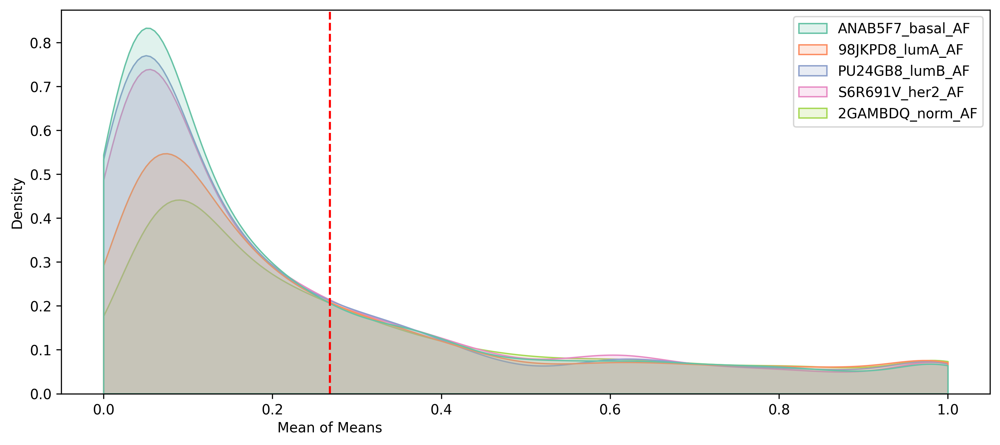

In [45]:
# filter out zero values
plt.figure(figsize=(12,5), dpi=300)
ax = sns.kdeplot(data=af_df[af_df != 0], fill=True, clip=(0,1), alpha=0.2, palette='Set2')
# draw a line at the mean of the means of the datasets
# Calculate the mean of the means of the datasets
mean_of_means = af_df[af_df != 0].mean(axis=0).mean()

# Draw a vertical line at the mean of the means
plt.axvline(x=mean_of_means, color='red', linestyle='--')
plt.text(mean_of_means, -0.1, s="Mean of Means", transform=ax.get_xaxis_transform(),
    horizontalalignment='center', color='black')

# Show the plot
plt.show()

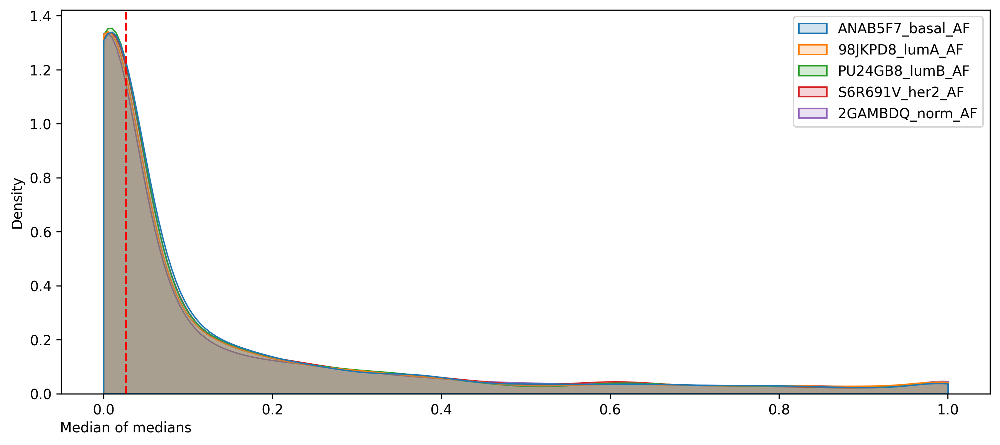

In [86]:
# filter out zero values
plt.figure(figsize=(12,5), dpi=300)
ax = sns.kdeplot(data=af_df, fill=True, clip=(0,1), alpha=0.2)
# draw a line at the mean of the means of the datasets
# Calculate the mean of the means of the datasets
median_of_medians = af_df.median(axis=0).median()

# Draw a vertical line at the mean of the means
plt.axvline(x=median_of_medians, color='red', linestyle='--')
plt.text(median_of_medians, -0.1, s="Median of medians", transform=ax.get_xaxis_transform(),
    horizontalalignment='center', color='black')

# Show the plot
plt.show()

We can also plot the AF distribution across TFBSs hued by the subtype as a scatterplot. This is to see if there are any differences in the AF distribution across subtypes.

In [47]:
# subset the dataframe to get just the _AF columns
af_region_df = final_df.filter(regex='_AF$|_id$')
af_region_df


,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,region_id
0,0.000000,0.000000,0.026316,0.000000,0.000000,chr1:191257-191268
1,0.812500,0.900000,0.833333,0.900000,0.875000,chr1:818021-818032
2,0.033333,0.125000,0.055556,0.062500,0.000000,chr1:818780-818791
3,0.000000,0.041667,0.000000,0.000000,0.000000,chr1:960570-960581
4,0.941176,1.000000,0.947368,0.911765,1.000000,chr1:977015-977026
...,...,...,...,...,...,...
9555,0.000000,0.000000,0.000000,0.000000,0.062500,chrX:153934861-153934872
9556,0.058824,0.125000,0.105263,0.000000,0.000000,chrX:154444629-154444640
9557,0.000000,0.312500,0.392857,0.100000,0.083333,chrX:155010397-155010408
9558,0.000000,0.000000,0.029412,0.000000,0.000000,chrX:155641610-155641621


In [63]:
# convert to long format (for a subset of regions)
af_region_df_long = af_region_df.iloc[:40].melt(id_vars="region_id", var_name="sample_id", value_name="AF")

# remove the "_AF" suffix from the "sample_id" column
af_region_df_long["sample_id"] = af_region_df_long["sample_id"].apply(lambda x: x.replace("_AF", ""))
af_region_df_long.to_csv("long-temp.tsv", sep="\t", index=False, na_rep='NULL')

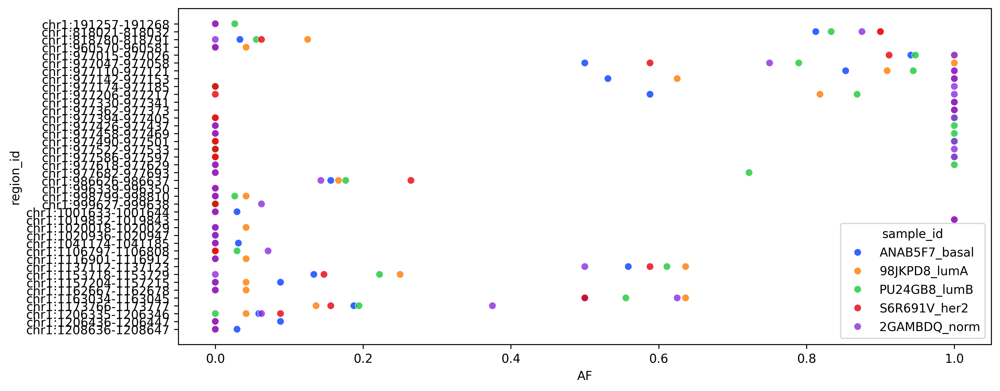

In [66]:
# plot scatterplot
plt.figure(figsize=(12,5), dpi=300)
sns.scatterplot(data=af_region_df_long, x='AF', y='region_id', hue='sample_id', palette='bright', alpha=0.8)
plt.show()

In [67]:
# convert to long format (for a subset of regions)
af_region_df_long = af_region_df.iloc[:].melt(id_vars="region_id", var_name="sample_id", value_name="AF")

# remove the "_AF" suffix from the "sample_id" column
af_region_df_long["sample_id"] = af_region_df_long["sample_id"].apply(lambda x: x.replace("_AF", ""))
af_region_df_long.to_csv("long-temp.tsv", sep="\t", index=False, na_rep='NULL')

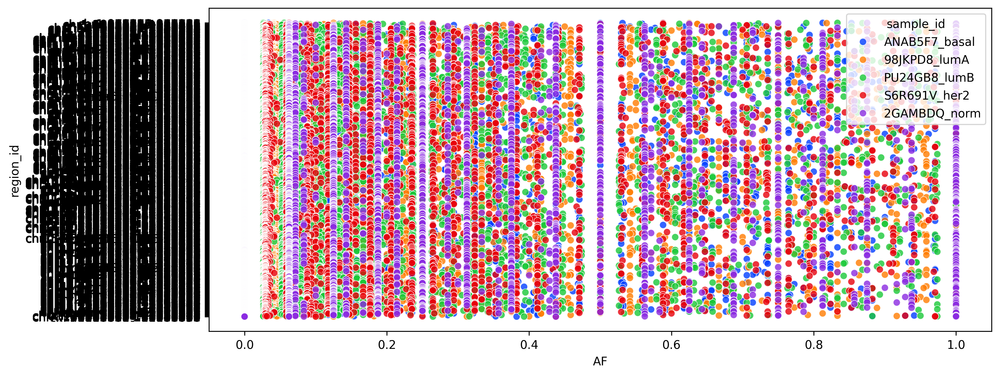

In [68]:
# plot scatterplot
plt.figure(figsize=(12,5), dpi=300)
sns.scatterplot(data=af_region_df_long, x='AF', y='region_id', hue='sample_id', palette='bright', alpha=0.8)
plt.show()

In [69]:
af_region_df_long

,region_id,sample_id,AF
0,chr1:191257-191268,ANAB5F7_basal,0.000000
1,chr1:818021-818032,ANAB5F7_basal,0.812500
2,chr1:818780-818791,ANAB5F7_basal,0.033333
3,chr1:960570-960581,ANAB5F7_basal,0.000000
4,chr1:977015-977026,ANAB5F7_basal,0.941176
...,...,...,...
47795,chrX:153934861-153934872,2GAMBDQ_norm,0.062500
47796,chrX:154444629-154444640,2GAMBDQ_norm,0.000000
47797,chrX:155010397-155010408,2GAMBDQ_norm,0.083333
47798,chrX:155641610-155641621,2GAMBDQ_norm,0.000000


#### Z-score normalization
Let's try to normalize the data using Z-score normalization. 

In [147]:
# subset the dataframe to get just the _AF columns
af_region_df = final_df.filter(regex='_AF$')
af_region_df.iloc[:]

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,0.000000,0.000000,0.026316,0.000000,0.000000
1,0.812500,0.900000,0.833333,0.900000,0.875000
2,0.033333,0.125000,0.055556,0.062500,0.000000
3,0.000000,0.041667,0.000000,0.000000,0.000000
4,0.941176,1.000000,0.947368,0.911765,1.000000
...,...,...,...,...,...
9555,0.000000,0.000000,0.000000,0.000000,0.062500
9556,0.058824,0.125000,0.105263,0.000000,0.000000
9557,0.000000,0.312500,0.392857,0.100000,0.083333
9558,0.000000,0.000000,0.029412,0.000000,0.000000


In [149]:
# check for rows with sigma = 0
# create a Boolean mask indicating which columns have all values equal to 0 or 1
zero_one_mask = ((af_region_df == 0) | (af_region_df == 1)).all(axis=1)

# count the number of columns with all values equal to 0 or 1
zero_one_counts = zero_one_mask.sum()

print(zero_one_counts)

807


In [134]:
af_region_df.describe()

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.000000,9560.000000,9560.000000,9560.000000,9560.000000
mean,0.124445,0.124244,0.123915,0.125958,0.125726
std,0.225746,0.234125,0.228397,0.228968,0.238772
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.029412,0.000000,0.026316,0.029412,0.000000
75%,0.133333,0.125000,0.131579,0.142857,0.125000
max,1.000000,1.000000,1.000000,1.000000,1.000000


In [135]:
# check if there are nan values
af_region_df.isnull().values.any()

False

In [146]:
# normalize the data
import scipy.stats as stats
af_region_df_norm = af_region_df.apply(stats.zscore, axis=1, ddof=0, nan_policy='omit')


# save to temp
# af_region_df_norm.to_csv("temp.tsv", sep="\t", index=False, na_rep='NULL')

af_region_df_norm.iloc[27:30]

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
27,NaN,NaN,NaN,NaN,NaN
28,2.000000,-0.500000,-0.500000,-0.500000,-0.500000
29,-0.719066,-0.719066,0.329572,-0.719066,1.827625


In [138]:
# check if there are nan values
af_region_df_norm.isnull().values.any()
# print nan values
af_region_df_norm[af_region_df_norm.isnull().any(axis=1)]

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
10,NaN,NaN,NaN,NaN,NaN
11,NaN,NaN,NaN,NaN,NaN
21,NaN,NaN,NaN,NaN,NaN
25,NaN,NaN,NaN,NaN,NaN
27,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
9529,NaN,NaN,NaN,NaN,NaN
9532,NaN,NaN,NaN,NaN,NaN
9544,NaN,NaN,NaN,NaN,NaN
9553,NaN,NaN,NaN,NaN,NaN


In [121]:
af_region_df_norm.describe()

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,8767.000000,8767.000000,8767.000000,8767.000000,8767.000000
mean,0.093923,-0.072169,0.045615,0.056666,-0.124035
std,1.039262,0.968771,0.987276,0.993214,0.993020
min,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000
25%,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000
50%,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000
75%,0.857479,0.500000,0.678040,0.740480,0.395475
max,2.000000,2.000000,2.000000,2.000000,2.000000


In [117]:
# create a Boolean mask indicating which values are null
null_mask = af_region_df_norm.isnull()

# count the number of null values in each column
null_counts = null_mask.sum()

print(null_counts)

ANAB5F7_basal_AF    793
98JKPD8_lumA_AF     793
PU24GB8_lumB_AF     793
S6R691V_her2_AF     793
2GAMBDQ_norm_AF     793
dtype: int64


<Axes: ylabel='Density'>

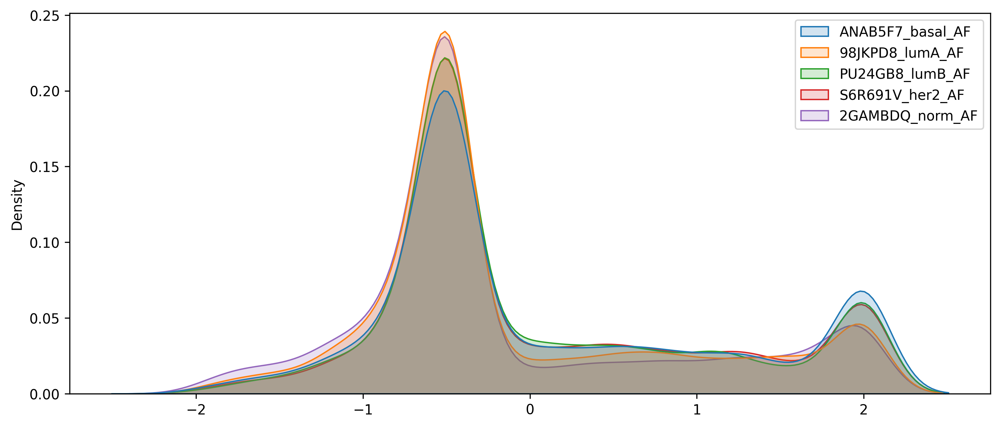

In [108]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=af_region_df_norm, fill=True, alpha=0.2)

In [103]:
# try z-score across the dataframe
af_region_df_norm_all = af_region_df.apply(stats.zscore)
af_region_df_norm_all

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,-0.551291,-0.530702,-0.427344,-0.550143,-0.526581
1,3.048082,3.313604,3.106244,3.380746,3.138199
2,-0.403624,0.003229,-0.299315,-0.277165,-0.526581
3,-0.551291,-0.352725,-0.542570,-0.550143,-0.526581
4,3.618116,3.740749,3.605555,3.432132,3.661739
...,...,...,...,...,...
9555,-0.551291,-0.530702,-0.542570,-0.550143,-0.264811
9556,-0.290703,0.003229,-0.081668,-0.550143,-0.526581
9557,-0.551291,0.804126,1.177585,-0.113378,-0.177555
9558,-0.551291,-0.530702,-0.413788,-0.550143,-0.526581


<Axes: ylabel='Density'>

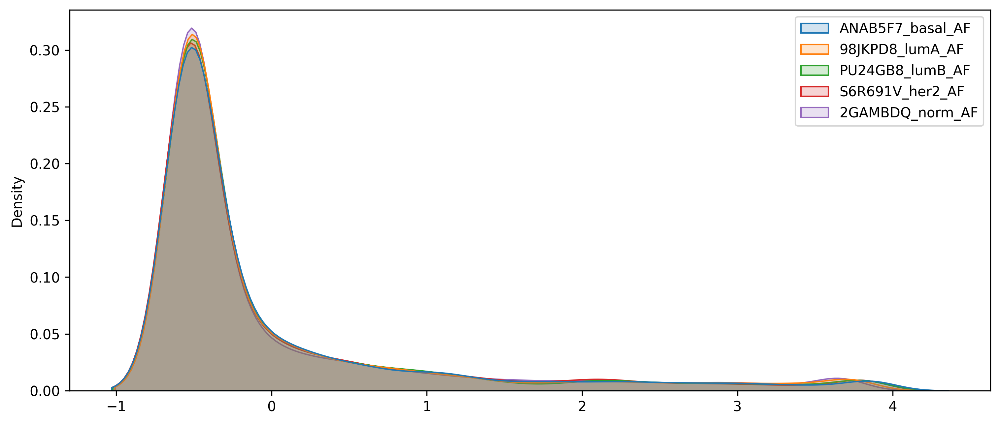

In [104]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=af_region_df_norm_all, fill=True, alpha=0.2)

In [111]:
# now filter for rows that contains at least one value greater than or less than 1 standard deviation away from zero
af_region_df_norm_filtered = af_region_df_norm[(np.abs(af_region_df_norm['ANAB5F7_basal_AF']) > 1) |
                                               (np.abs(af_region_df_norm['98JKPD8_lumA_AF']) > 1) |
                                               (np.abs(af_region_df_norm['PU24GB8_lumB_AF']) > 1) |
                                               (np.abs(af_region_df_norm['S6R691V_her2_AF']) > 1) |
                                               (np.abs(af_region_df_norm['2GAMBDQ_norm_AF']) > 1)]
af_region_df_norm_filtered


,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,-0.500000,-0.500000,2.000000,-0.500000,-0.500000
1,-1.454898,1.009045,-0.868254,1.009045,0.305061
2,-0.533785,1.695946,0.006758,0.175676,-1.344595
3,-0.500000,2.000000,-0.500000,-0.500000,-0.500000
4,-0.543355,1.149044,-0.365208,-1.389526,1.149044
...,...,...,...,...,...
9555,-0.500000,-0.500000,-0.500000,-0.500000,2.000000
9556,0.019399,1.295270,0.914744,-1.114707,-1.114707
9557,-1.192990,0.904531,1.443893,-0.521783,-0.633651
9558,-0.500000,-0.500000,2.000000,-0.500000,-0.500000


<Axes: ylabel='Density'>

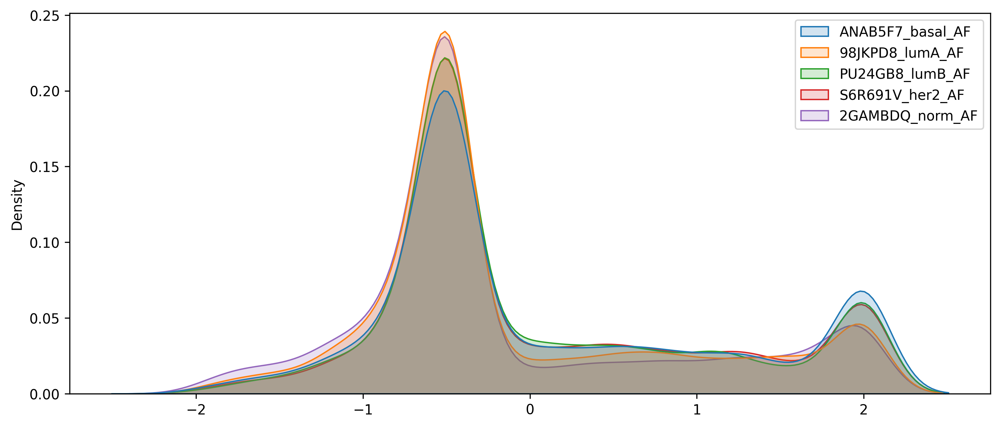

In [112]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=af_region_df_norm_filtered, fill=True, alpha=0.2)

In [109]:
# now filter for rows that contains at least one value greater than or less than 1 standard deviation away from zero
af_region_df_norm_filtered = af_region_df_norm[np.abs(af_region_df_norm['ANAB5F7_basal_AF']) > 1]
af_region_df_norm_filtered

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
1,-1.454898,1.009045,-0.868254,1.009045,0.305061
5,-1.303318,1.585986,0.369439,-0.793442,0.141334
6,-1.574444,-0.573869,0.056111,1.046101,1.046101
7,-1.436842,-0.987829,0.808224,0.808224,0.808224
24,2.000000,-0.500000,-0.500000,-0.500000,-0.500000
...,...,...,...,...,...
9543,2.000000,-0.500000,-0.500000,-0.500000,-0.500000
9547,1.797604,-0.732358,0.399469,-0.732358,-0.732358
9548,1.334719,-0.814405,1.108494,-0.814405,-0.814405
9551,-1.914968,0.800288,0.192923,0.121468,0.800288


<Axes: ylabel='Density'>

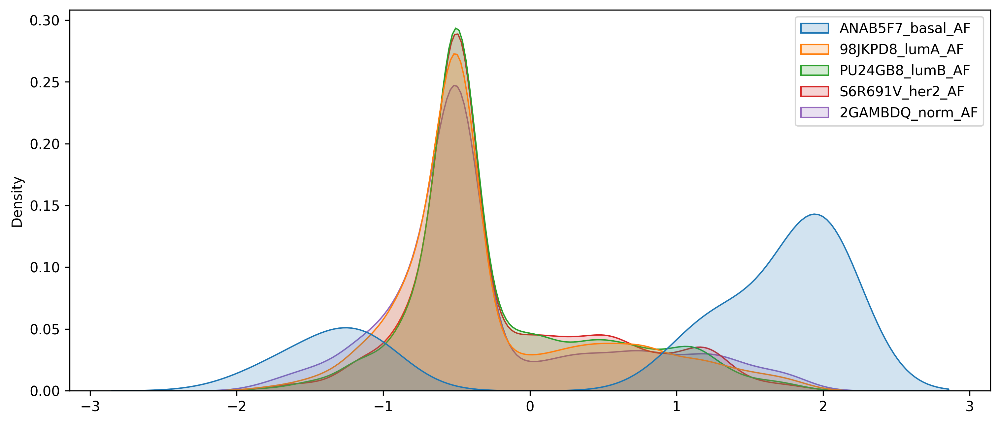

In [110]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=af_region_df_norm_filtered, fill=True, alpha=0.2)

#### Plotting Footprinting Scores (FPS)

Now let's subset the filtered gr object into a dataframe containing only the FPS data. 

Then, we can plot the FPS distribution for each subtype.

In [46]:
# subset the dataframe to gget just the _fps columns
fps_df = final_df.filter(regex='_fps$')
fps_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
0,0.00000,0.00000,0.00000,0.00000,0.00000
1,0.02966,0.04399,0.02131,0.03470,0.03443
2,0.02572,0.02376,0.02271,0.02814,0.03391
3,0.28046,0.33500,0.28495,0.27618,0.22986
4,1.10047,0.50514,0.71035,1.21305,1.30155
...,...,...,...,...,...
9555,0.19670,0.16790,0.17212,0.19046,0.16161
9556,0.04900,0.07431,0.07307,0.09013,0.04233
9557,0.01177,0.00497,0.00875,0.01298,0.01987
9558,0.01249,0.01243,0.01329,0.01492,0.01740


In [19]:
# see summary statistics
fps_df.describe()

,98JKPD8_LumA_fps,ANAB5F7_Basal_fps,S6R691V_Her2_fps,PU24GB8_LumB_fps,2GAMBDQ_Norm_fps
count,9560.000000,9560.000000,9560.000000,9560.000000,9560.000000
mean,0.155554,0.157642,0.148496,0.162025,0.153660
std,0.309816,0.309043,0.302980,0.329782,0.298205
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.017960,0.016290,0.018538,0.019350,0.021660
50%,0.034860,0.037170,0.037005,0.036590,0.037885
75%,0.132000,0.137950,0.121908,0.134380,0.130420
max,3.791580,3.936080,7.650910,3.674660,3.764110


In [20]:
# this is actually in a wide format, so we need to melt it into a long format for plotting
fps_df_long = fps_df.melt(var_name="sample_id", value_name="FPS")
# remove the "_fps" suffix from the "sample_id" column
fps_df_long["sample_id"] = fps_df_long["sample_id"].apply(lambda x: x.replace("_fps", ""))
fps_df_long

,sample_id,FPS
0,98JKPD8_LumA,0.00000
1,98JKPD8_LumA,0.02966
2,98JKPD8_LumA,0.02572
3,98JKPD8_LumA,0.28046
4,98JKPD8_LumA,1.10047
...,...,...
47795,2GAMBDQ_Norm,0.16161
47796,2GAMBDQ_Norm,0.04233
47797,2GAMBDQ_Norm,0.01987
47798,2GAMBDQ_Norm,0.01740


Text(0.5, 1.0, 'Distribution of Footprinting Scores across Called Variants in TFDP1_M08108_2.00 TFBS')

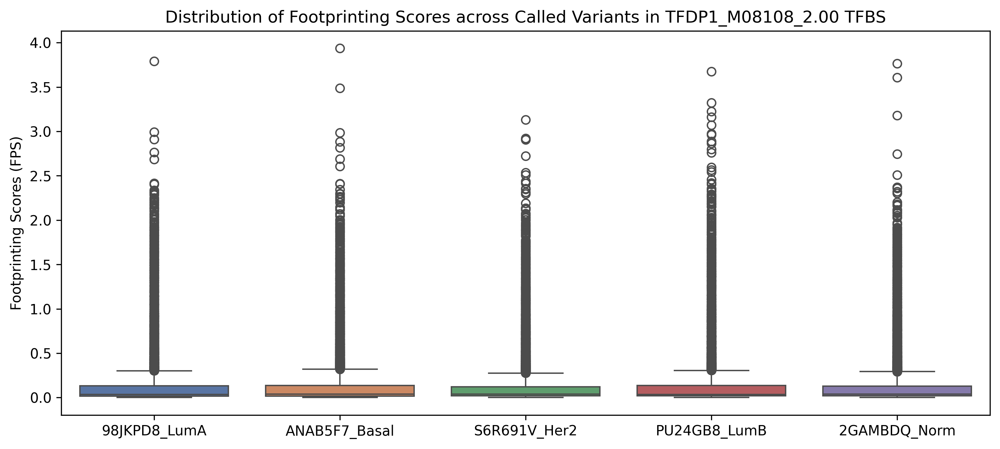

In [21]:
# plot boxplot
plt.figure(figsize=(12,5), dpi=300)
sns.boxplot(data=fps_df_long[fps_df_long.FPS < 5], x='sample_id', y='FPS', hue='sample_id', palette='deep') # this removes the one extreme outlier in one of the data

# add labels and title
plt.xlabel('')
plt.ylabel('Footprinting Scores (FPS)')
plt.title('Distribution of Footprinting Scores across Called Variants in TFDP1_M08108_2.00 TFBS')

<Axes: xlabel='FPS', ylabel='Density'>

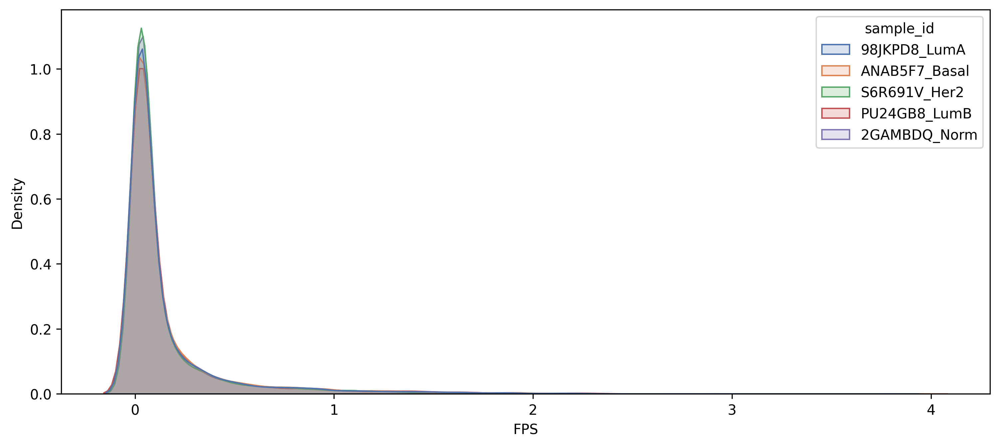

In [91]:
# plot boxplot
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=fps_df_long[fps_df_long.FPS < 5], x='FPS', hue='sample_id', palette='deep', fill=True, alpha=0.2) # this removes the one extreme outlier in one of the data

# # add labels and title
# plt.xlabel('')
# plt.ylabel('Footprinting Scores (FPS)')
# plt.title('Distribution of Footprinting Scores across Called Variants in TFDP1_M08108_2.00 TFBS')

In [22]:
# extract both the fps and af columns from the original dataframe, maintaining row relationship
fps_af_df = final_df.filter(regex='_fps$|_AF$|_id$')
fps_af_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,region_id
0,0.00000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.026316,0.000000,0.000000,chr1:191257-191268
1,0.02966,0.04399,0.02131,0.03470,0.03443,0.812500,0.900000,0.833333,0.900000,0.875000,chr1:818021-818032
2,0.02572,0.02376,0.02271,0.02814,0.03391,0.033333,0.125000,0.055556,0.062500,0.000000,chr1:818780-818791
3,0.28046,0.33500,0.28495,0.27618,0.22986,0.000000,0.041667,0.000000,0.000000,0.000000,chr1:960570-960581
4,1.10047,0.50514,0.71035,1.21305,1.30155,0.941176,1.000000,0.947368,0.911765,1.000000,chr1:977015-977026
...,...,...,...,...,...,...,...,...,...,...,...
9555,0.19670,0.16790,0.17212,0.19046,0.16161,0.000000,0.000000,0.000000,0.000000,0.062500,chrX:153934861-153934872
9556,0.04900,0.07431,0.07307,0.09013,0.04233,0.058824,0.125000,0.105263,0.000000,0.000000,chrX:154444629-154444640
9557,0.01177,0.00497,0.00875,0.01298,0.01987,0.000000,0.312500,0.392857,0.100000,0.083333,chrX:155010397-155010408
9558,0.01249,0.01243,0.01329,0.01492,0.01740,0.000000,0.000000,0.029412,0.000000,0.000000,chrX:155641610-155641621


In [23]:
# melt the dataframe into a long format
fps_af_df_long = fps_af_df.melt(id_vars=['region_id'], var_name="variable", value_name="value")
fps_af_df_long

# split the variable column into sample_id and type columns
fps_af_df_long[['sample_id', 'type']] = fps_af_df_long['variable'].str.rsplit('_', n=1, expand=True)

# drop the variable column
fps_af_df_long = fps_af_df_long.drop(columns=["variable"])
fps_af_df_long



,region_id,value,sample_id,type
0,chr1:191257-191268,0.000000,98JKPD8_lumA,fps
1,chr1:818021-818032,0.029660,98JKPD8_lumA,fps
2,chr1:818780-818791,0.025720,98JKPD8_lumA,fps
3,chr1:960570-960581,0.280460,98JKPD8_lumA,fps
4,chr1:977015-977026,1.100470,98JKPD8_lumA,fps
...,...,...,...,...
95595,chrX:153934861-153934872,0.062500,2GAMBDQ_norm,AF
95596,chrX:154444629-154444640,0.000000,2GAMBDQ_norm,AF
95597,chrX:155010397-155010408,0.083333,2GAMBDQ_norm,AF
95598,chrX:155641610-155641621,0.000000,2GAMBDQ_norm,AF


In [24]:
# pivot the dataframe to create new columns based on the type column
fps_af_df_pivoted = fps_af_df_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# rename the columns to match the type values
fps_af_df_pivoted = fps_af_df_pivoted.rename(columns={'fps': 'FPS', 'AF': 'AF'})

fps_af_df_pivoted

# group the dataframe by region_id and select the first non-null value for each group
fps_af_df_groupedfps = fps_af_df_pivoted.groupby(['region_id', 'sample_id'])["FPS"].max().dropna().reset_index()

fps_af_df_groupedaf = fps_af_df_pivoted.groupby(['region_id', 'sample_id'])["AF"].max().dropna().reset_index()

fps_af_df_groupedfps

,region_id,sample_id,FPS
0,chr10:100346639-100346650,2GAMBDQ_norm,0.19083
1,chr10:100346639-100346650,98JKPD8_lumA,0.14846
2,chr10:100346639-100346650,ANAB5F7_basal,0.17826
3,chr10:100346639-100346650,PU24GB8_lumB,0.29395
4,chr10:100346639-100346650,S6R691V_her2,0.21586
...,...,...,...
47795,chrY:11108019-11108030,2GAMBDQ_norm,0.00000
47796,chrY:11108019-11108030,98JKPD8_lumA,0.00000
47797,chrY:11108019-11108030,ANAB5F7_basal,0.00000
47798,chrY:11108019-11108030,PU24GB8_lumB,0.00000


In [25]:
# merge the two dataframes based on region_id and sample_id
fps_af_df_merged = fps_af_df_groupedfps.merge(fps_af_df_groupedaf, on=['region_id', 'sample_id'])


fps_af_df_merged.to_csv("TFDP1_M08108_2.00_fpscore-af-varsites-combined-matrix-long.tsv", sep="\t", index=False, na_rep='NULL')
fps_af_df_merged

,region_id,sample_id,FPS,AF
0,chr10:100346639-100346650,2GAMBDQ_norm,0.19083,0.000000
1,chr10:100346639-100346650,98JKPD8_lumA,0.14846,0.000000
2,chr10:100346639-100346650,ANAB5F7_basal,0.17826,0.000000
3,chr10:100346639-100346650,PU24GB8_lumB,0.29395,0.000000
4,chr10:100346639-100346650,S6R691V_her2,0.21586,0.000000
...,...,...,...,...
47795,chrY:11108019-11108030,2GAMBDQ_norm,0.00000,0.437500
47796,chrY:11108019-11108030,98JKPD8_lumA,0.00000,0.100000
47797,chrY:11108019-11108030,ANAB5F7_basal,0.00000,0.382353
47798,chrY:11108019-11108030,PU24GB8_lumB,0.00000,0.264706


<Axes: xlabel='AF', ylabel='FPS'>

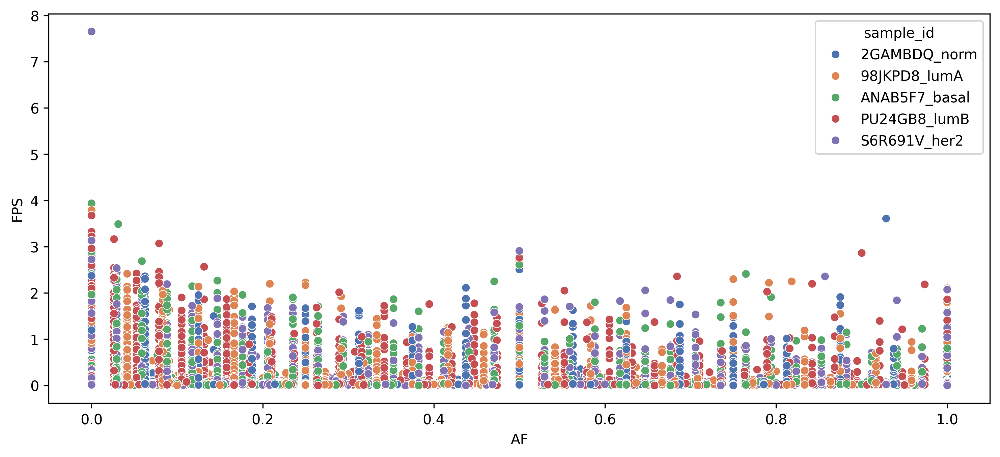

In [22]:
# plot correlation between AF and FPS with sample_id as hue
plt.figure(figsize=(12,5), dpi=300)
sns.scatterplot(data=fps_af_df_merged, x='AF', y='FPS', hue='sample_id', palette='deep')


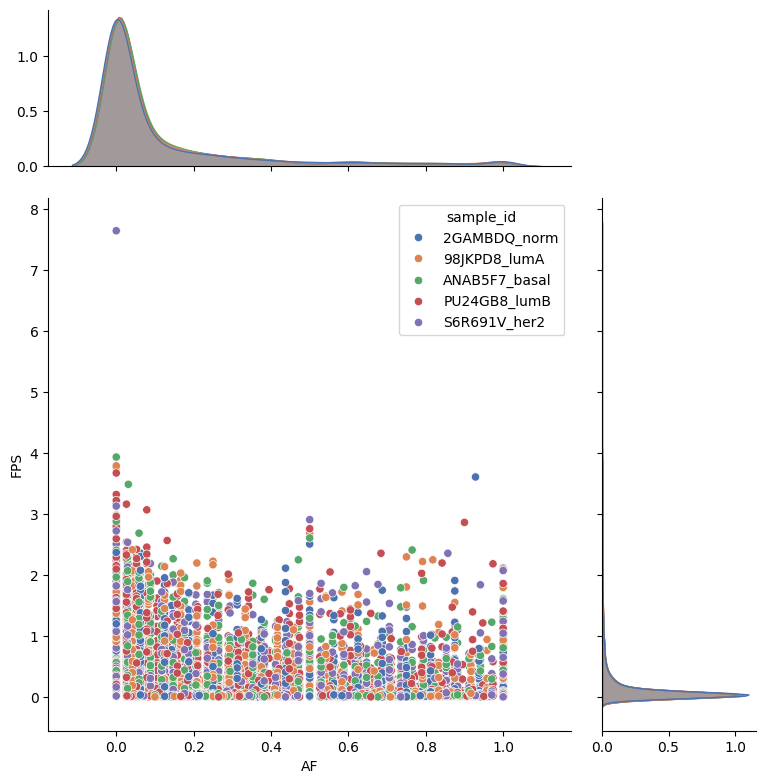

In [41]:
sns.jointplot(data=fps_af_df_merged, x='AF', y='FPS', hue='sample_id', palette='deep', height=8, ratio=3, marginal_ticks=True)

### Z-Score Normalization of FPS


The FPS data is not normally distributed. To normalize the data, we can use the Z-score method.


In [26]:
# load the fps wide format
fps_af_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,region_id
0,0.00000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.026316,0.000000,0.000000,chr1:191257-191268
1,0.02966,0.04399,0.02131,0.03470,0.03443,0.812500,0.900000,0.833333,0.900000,0.875000,chr1:818021-818032
2,0.02572,0.02376,0.02271,0.02814,0.03391,0.033333,0.125000,0.055556,0.062500,0.000000,chr1:818780-818791
3,0.28046,0.33500,0.28495,0.27618,0.22986,0.000000,0.041667,0.000000,0.000000,0.000000,chr1:960570-960581
4,1.10047,0.50514,0.71035,1.21305,1.30155,0.941176,1.000000,0.947368,0.911765,1.000000,chr1:977015-977026
...,...,...,...,...,...,...,...,...,...,...,...
9555,0.19670,0.16790,0.17212,0.19046,0.16161,0.000000,0.000000,0.000000,0.000000,0.062500,chrX:153934861-153934872
9556,0.04900,0.07431,0.07307,0.09013,0.04233,0.058824,0.125000,0.105263,0.000000,0.000000,chrX:154444629-154444640
9557,0.01177,0.00497,0.00875,0.01298,0.01987,0.000000,0.312500,0.392857,0.100000,0.083333,chrX:155010397-155010408
9558,0.01249,0.01243,0.01329,0.01492,0.01740,0.000000,0.000000,0.029412,0.000000,0.000000,chrX:155641610-155641621


In [27]:
# subset only the _fps columns
fps_af_df.filter(regex='_fps$')

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
0,0.00000,0.00000,0.00000,0.00000,0.00000
1,0.02966,0.04399,0.02131,0.03470,0.03443
2,0.02572,0.02376,0.02271,0.02814,0.03391
3,0.28046,0.33500,0.28495,0.27618,0.22986
4,1.10047,0.50514,0.71035,1.21305,1.30155
...,...,...,...,...,...
9555,0.19670,0.16790,0.17212,0.19046,0.16161
9556,0.04900,0.07431,0.07307,0.09013,0.04233
9557,0.01177,0.00497,0.00875,0.01298,0.01987
9558,0.01249,0.01243,0.01329,0.01492,0.01740


In [34]:
fps_af_df.filter(regex='_fps$').describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9560.000000,9560.000000,9560.000000,9560.000000,9560.000000
mean,0.155554,0.157642,0.148496,0.162025,0.153660
std,0.309816,0.309043,0.302980,0.329782,0.298205
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.017960,0.016290,0.018538,0.019350,0.021660
50%,0.034860,0.037170,0.037005,0.036590,0.037885
75%,0.132000,0.137950,0.121908,0.134380,0.130420
max,3.791580,3.936080,7.650910,3.674660,3.764110


<Axes: ylabel='Density'>

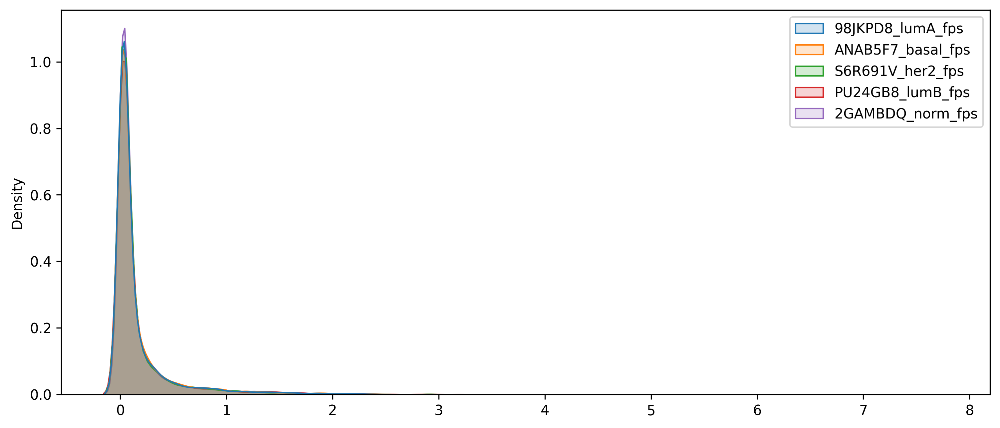

In [31]:
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=fps_af_df.filter(regex='_fps$'), fill=True, alpha=0.2)

In [36]:
# z-score normalize the fps columns
from scipy.stats import zscore
zscored_fps_df = fps_af_df.filter(regex='_fps$').apply(zscore, axis=1)
zscored_fps_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
0,NaN,NaN,NaN,NaN,NaN
1,-0.427099,1.510941,-1.556383,0.254528,0.218013
2,-0.282935,-0.774559,-1.037929,0.324071,1.771352
3,-0.024868,1.609209,0.109657,-0.153101,-1.540897
4,0.438480,-1.504392,-0.834685,0.805887,1.094709
...,...,...,...,...,...
9555,1.404178,-0.730778,-0.417947,0.941605,-1.197058
9556,-0.952267,0.485106,0.414686,1.383536,-1.331061
9557,0.020617,-1.353850,-0.589808,0.265191,1.657850
9558,-0.861348,-0.893328,-0.434938,0.433872,1.755742


In [37]:
zscored_fps_df.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9408.000000,9408.000000,9408.000000,9408.000000,9408.000000
mean,-0.067981,-0.122151,-0.156337,0.129215,0.217255
std,0.894209,1.230807,0.936255,0.868650,0.973149
min,-1.972266,-1.994684,-1.998946,-1.989147,-1.987634
25%,-0.731892,-1.196950,-0.847111,-0.549270,-0.536761
50%,-0.195452,-0.429442,-0.317225,0.050360,0.137775
75%,0.583821,1.021715,0.482178,0.795620,1.036462
max,1.996683,1.999633,1.998741,1.994724,1.998141


<Axes: ylabel='Density'>

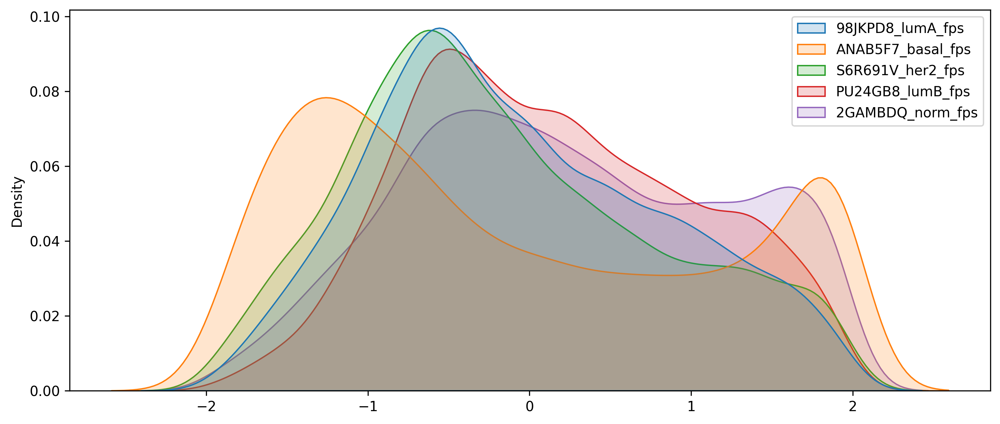

In [38]:
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=zscored_fps_df, fill=True, alpha=0.2)